## Contents:
* [Loading packages](#Loading_packages)
* [Reading cell2location model output and defining useful functions](#read)


* [Fig 3C](#Fig3C)
* [Fig 3D](#Fig3D)
* [Fig 3E](#Fig3E)


* [Fig 2D](#Fig2D)
* [Fig 2E](#Fig2E)
* [Fig 2F multicolor and panels](#Fig2F)


* [Fig 2G reproducibility of cortical layer mapping between mice - loading and functions](#Fig2G)
* [Fig 2G plot](#Fig2Gplot)

### Loading packages <a class="anchor" id="Loading_packages"></a>

In [1]:
# Import modules and packages:
%pylab inline
import pandas as pd
import sys, ast, os
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
import pickle as pickle
import numpy as np
import time
import itertools
data_type = 'float32'

os.environ["THEANO_FLAGS"] = 'device=cuda,floatX=' + data_type + ',force_device=True'
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/cell2location/')
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import os
import cell2location.models as c2l
import anndata
import scanpy as sc

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text

Populating the interactive namespace from numpy and matplotlib


WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
/nfs/users/nfs_v/vk7/.local/lib/python3.7/site-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 7605 on context None
Mapped name None to device cuda: Tesla V100-SXM2-32GB (0000:62:00.0)


### Reading cell2location model output and defining useful functions <a class="anchor" id="read"></a> 

In [2]:
# read a previously trained LocationModel
results_folder = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/mouse_viseum_snrna/'
sp_results_folder = f'{results_folder}'
sc_results_folder = f'{results_folder}regression_model/'

run_name = 'CoLocationModelNB4E6V2_59clusters_14968locations_12809genes_n_comb50_mean_var5_inferred_30k'

# path for saving figures
fig_path = f'{sp_results_folder}{run_name}/plots/figures/'
sc_figpath = sc.settings.figdir
sc.settings.figdir = f'{fig_path}'

sp_data_file = f'{sp_results_folder}{run_name}/sp_with_clusters.h5ad'
adata_vis = anndata.read(sp_data_file)
#adata_vis.obs['sample'] = list(adata_vis.uns['spatial'].keys())[0]

In [3]:
# annotate region clusters
region_annot = pd.read_csv(f'{sp_results_folder}{run_name}/20200904_regionAnnotation_copy.csv')
region_annot = region_annot.loc[~region_annot['region_04092020'].isna(),:]
region_annot.index = region_annot['region_04092020'].astype(int).astype(str)
region_annot['region_final'] = region_annot['region_final'].astype(int).astype(str)
region_annot.index.name = 'region_cluster'
region_annot = region_annot.reindex(index = list(adata_vis.obs['region_cluster']))
region_annot.index = adata_vis.obs_names

adata_vis.obs[region_annot.columns] = region_annot

In [4]:
# identify spot locations to crop near tissue
def get_crop_coord(slide):

    crop_max = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef']).max(axis=0)
    crop_min = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef']).min(axis=0)

    crop_x = [crop_min[0]-50, crop_max[0]+50]
    crop_y = [crop_min[1]-20, crop_max[1]+0]

    return crop_x, crop_y
    

def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'region_final' as categorical
... storing 'old_region' as categorical
... storing 'location' as categorical
... storing 'subregion' as categorical
... storing 'cortical_layer' as categorical
... storing 'region_label' as categorical
... storing 'comments' as categorical


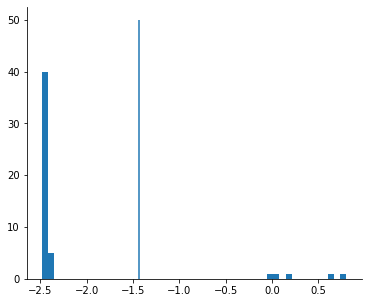

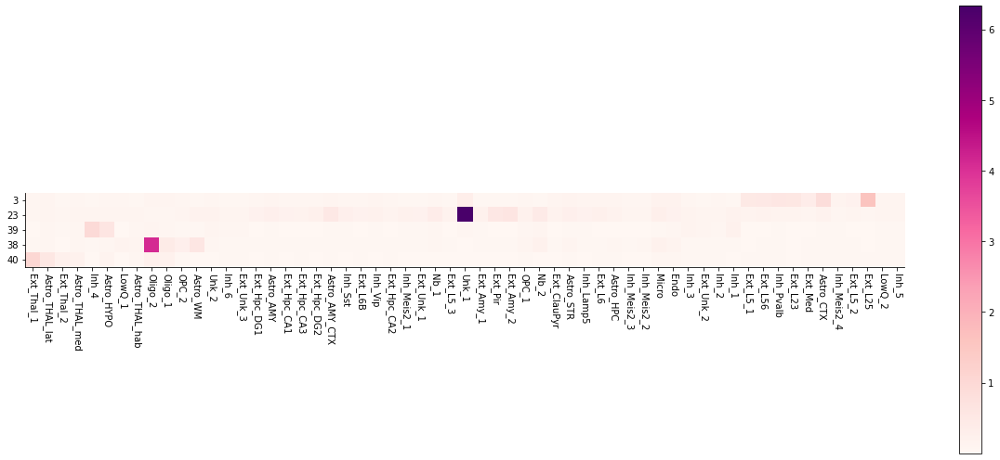

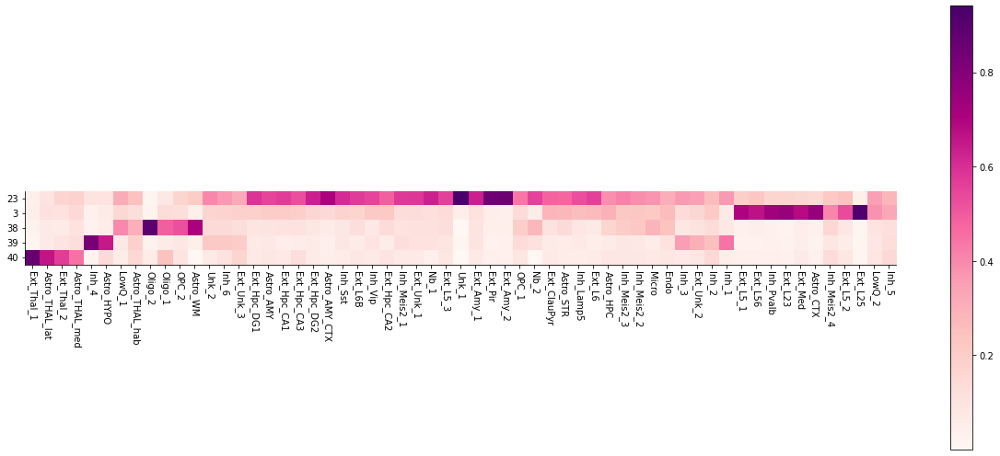

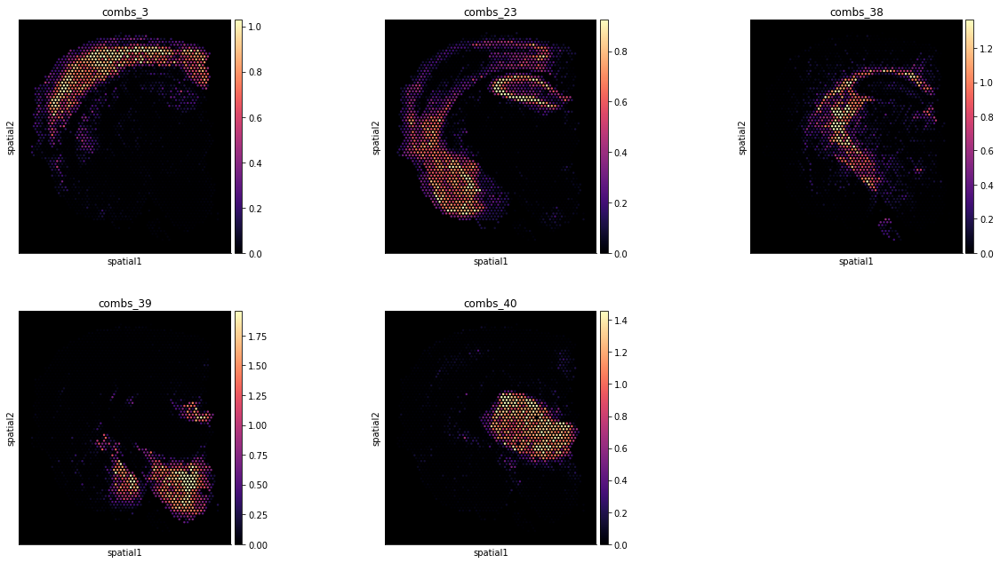

In [5]:
from cell2location.plt.plot_heatmap import clustermap
comb2fact_df = pd.DataFrame(adata_vis.uns['mod']['post_sample_means']['comb2fact'],
                            columns=adata_vis.uns['mod']['fact_names'])

rcParams["figure.figsize"] = [6, 5]
rcParams["axes.facecolor"] = "white"
plt.hist(np.log10(comb2fact_df.max(1)), bins=50);
thresh = 0.037
plt.vlines(np.log10(thresh), 0, 50);
fact_filt = comb2fact_df.max(1) > thresh

comb2fact_df = comb2fact_df.loc[fact_filt.values, :]

clustermap(comb2fact_df, figure_size=(17, 7))

comb2fact_df_prop = (comb2fact_df / comb2fact_df.sum(0))
clustermap(comb2fact_df_prop, figure_size=(17, 7))

n_combs = adata_vis.uns['mod']['post_sample_means']['combs_factors'].shape[1]
combs_factors = pd.DataFrame(adata_vis.uns['mod']['post_sample_means']['combs_factors'],
                             columns=[f'combs_{i}' for i in range(n_combs)],
                             index=adata_vis.uns['mod']['obs_names'])
combs_factors = combs_factors.loc[:, fact_filt.values]
adata_vis.obs[combs_factors.columns] = combs_factors

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

s = 'spaceranger100_count_30458_ST8059048_mm10-3_0_0_premrna'
rcParams["axes.facecolor"] = "black"
sc.pl.spatial(slide, cmap='magma',
              color=combs_factors.columns, # limit size in this notebook
              library_id=f'{s}',
              ncols=3, 
              size=1, img_key='hires', 
              alpha_img=0,
              vmin=0, vmax='p99.0'
             )

### Fig 3C <a class="anchor" id="Fig3C"></a> 

In [6]:
# identify spot locations to crop near tissue
def get_crop_coord(slide):

    crop_max = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef']).max(axis=0)
    crop_min = (slide.obsm['spatial'] * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef']).min(axis=0)

    crop_x = [crop_min[0]-50, crop_max[0]+50]
    crop_y = [crop_min[1]-20, crop_max[1]+0]

    return crop_x, crop_y

Trying to set attribute `.uns` of view, copying.


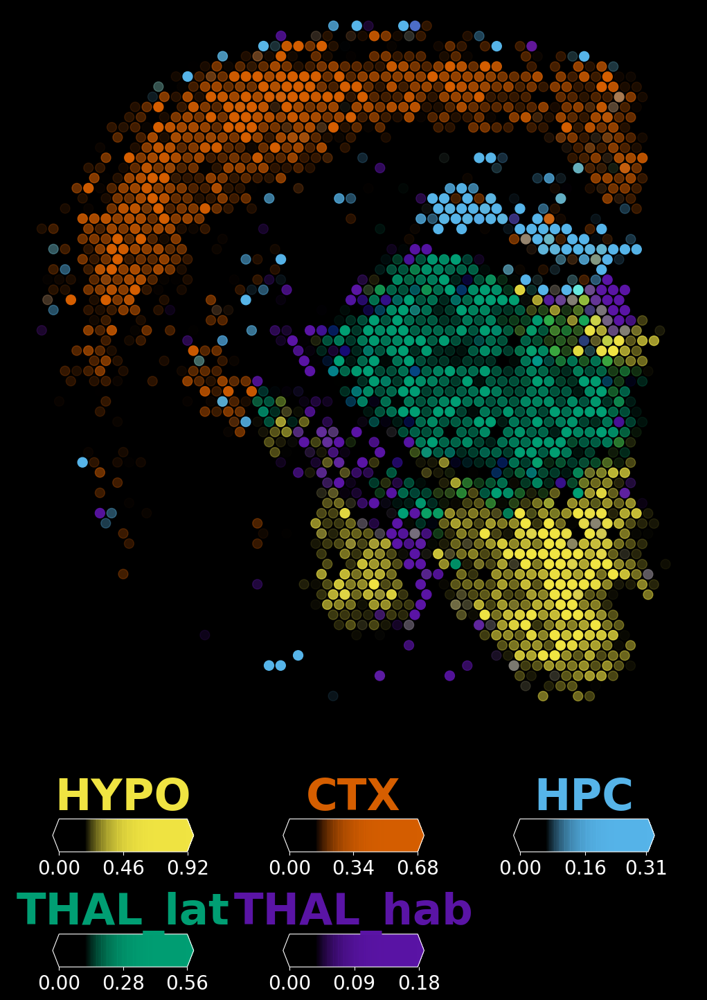

In [7]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = ['Astro_HYPO','Astro_CTX','Astro_HPC','Astro_THAL_lat', 'Astro_THAL_hab']
sel_clust_lab = ['HYPO','CTX','HPC','THAL_lat', 'THAL_hab']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]
# s = 'ST8059048'

# slide = adata_vis[adata_vis.obs['sample']==s]
def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata_vis[adata_vis.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):

    fig = plot_spatial(slide.obs[sel_clust_col], 
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=False, img_alpha=1,
                  #max_col=np.array((1, 1, 1, 1, 1, 1, 1)) * 0.7,
                  max_color_quantile=0.98, #reorder_cmap=[0,4],
              img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=10, alpha_scaling=1, labels=sel_clust_lab, 
                 style='dark_background', # fast dark_background
              crop_x=crop_x, crop_y=crop_y,
                 colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                 colorbar_shape={'vertical_gaps': 0.31, 'horizontal_gaps': 1, 
                                 'width': 3.5, 'height': 0.045},
                 colorbar_tick_size=20)
    fig.savefig(f'{fig_path}Fig3C_multicell_maps.pdf',
                bbox_inches='tight', facecolor='black')

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


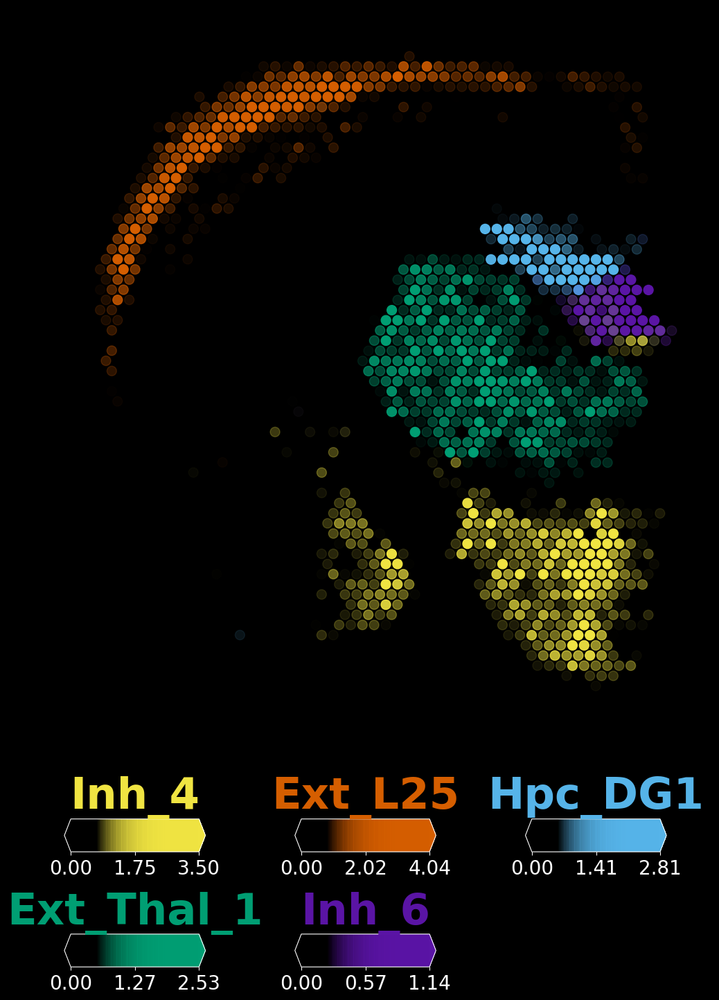

In [8]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = ['Inh_4','Ext_L25','Ext_Hpc_DG1','Ext_Thal_1', 'Inh_6']
sel_clust_lab = ['Inh_4','Ext_L25','Hpc_DG1','Ext_Thal_1', 'Inh_6']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]
# s = 'ST8059048'

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):

    fig = plot_spatial(slide.obs[sel_clust_col], 
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=False, img_alpha=1,
                  max_color_quantile=0.99, #reorder_cmap=[0,4],
              img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=10, alpha_scaling=1, labels=sel_clust_lab, 
                 style='dark_background', # fast dark_background
              crop_x=crop_x, crop_y=crop_y,
                 colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                 colorbar_shape={'vertical_gaps': 0.31, 'horizontal_gaps': 1, 
                                 'width': 3.5, 'height': 0.045},
                 colorbar_tick_size=20,
                )
    fig.savefig(f'{fig_path}Fig3C_suppl_multicell_maps_neuro.pdf',
                bbox_inches='tight', facecolor='black')

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'old_region' as categorical
... storing 'subregion' as categorical
... storing 'cortical_layer' as categorical
... storing 'comments' as categorical


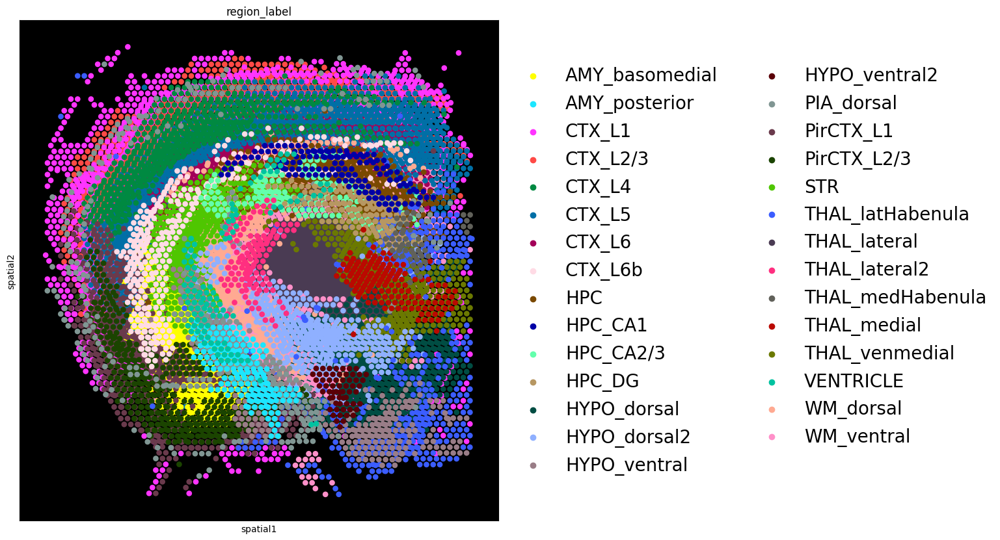

In [9]:
adata_vis = adata_vis[adata_vis.obs['region_final'].astype('int').argsort(),:]
adata_vis.obs['region_final'] = adata_vis.obs['region_final'].astype('category')
cat_order = adata_vis.obs['region_final'].cat.categories.astype(int).sort_values().astype('str')
adata_vis.obs['region_final'].cat.reorder_categories(cat_order, inplace=True)
adata_vis.obs['region_label'] = adata_vis.obs['region_label'].astype('category')
cat_order = adata_vis.obs['region_label'].cat.categories.sort_values().astype('str')
adata_vis.obs['region_label'].cat.reorder_categories(cat_order, inplace=True)
adata_vis.obs['location'] = adata_vis.obs['location'].astype('category')

s = 'ST8059048'
slide = select_slide(adata_vis, s)
crop_x, crop_y = get_crop_coord(slide)

with matplotlib.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [10, 10]}):


    # Visualize cell type locations
    # making copy to transform to log & assign nice names
    sc.pl.spatial(adata_vis, #cmap='magma',
                  color=['region_label'], ncols=4, 
                  #library_id=s,
                  size=1.3, img_key='hires', alpha_img=0,
                  frameon=True, legend_fontsize=20,
                  #crop_coord=crop_x + [crop_y[0]] + [crop_y[1]],
                  vmin=0, vmax='p99.5', save='Fig3C_2D_final_clusters.pdf',
                  palette=sc.pl.palettes.default_102
                 )

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'old_region' as categorical
... storing 'subregion' as categorical
... storing 'cortical_layer' as categorical
... storing 'comments' as categorical


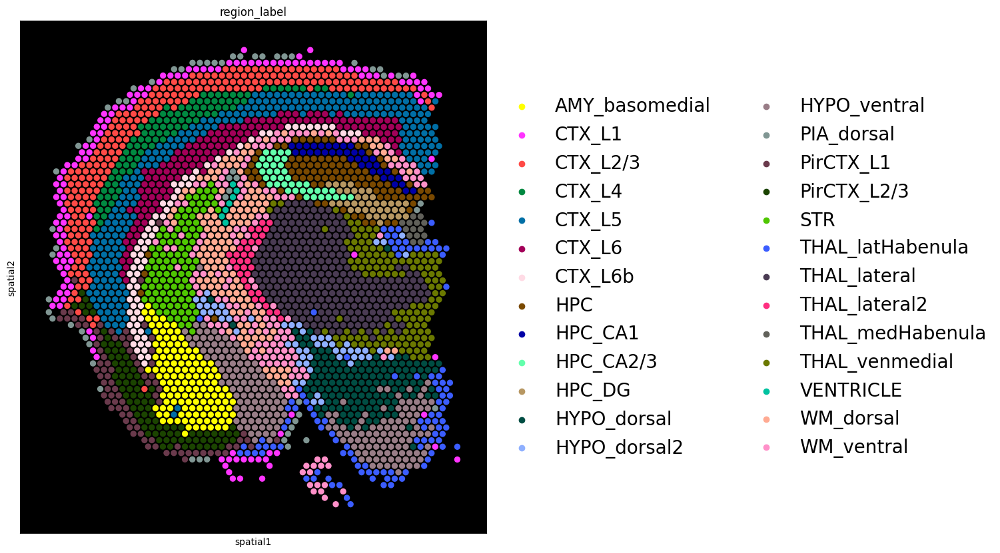

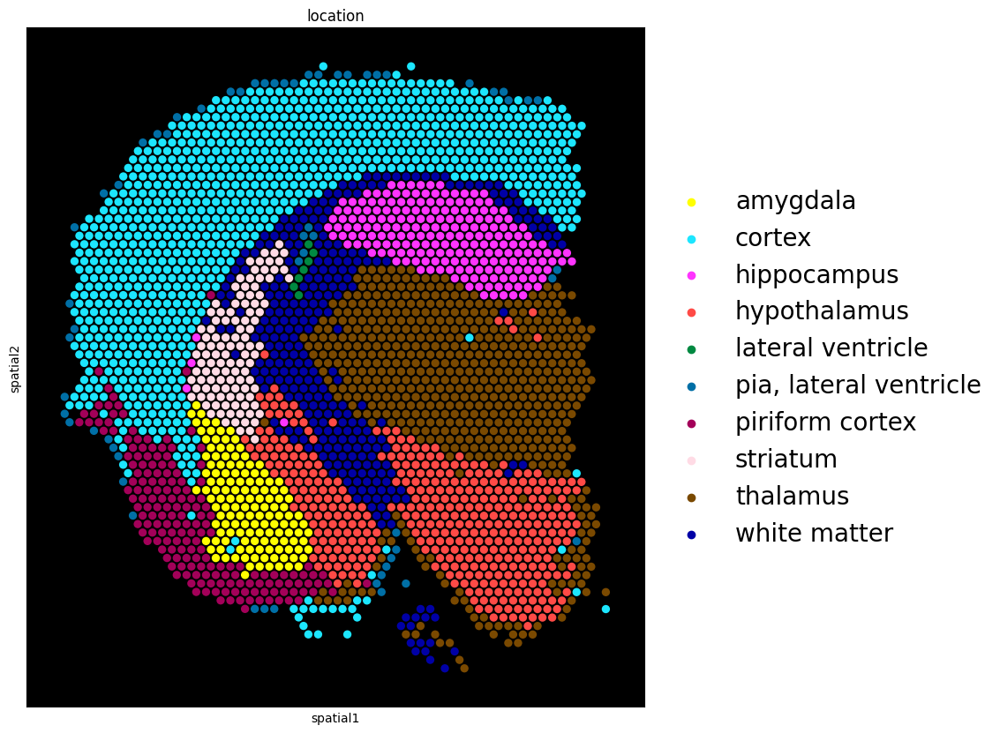

In [10]:
with matplotlib.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [10, 10]}):
    
    sel_clust = adata_vis.obs['region_label'].cat.categories.isin(slide.obs['region_label'].cat.categories)
    slide.uns['region_label_colors'] = list(np.array(adata_vis.uns['region_label_colors'])[sel_clust])
    sc.pl.spatial(slide, #cmap='magma',
                  color=['region_label'], ncols=4, 
                  #library_id=s,
                  size=1.3, img_key='hires', alpha_img=0,
                  frameon=True, legend_fontsize=20,
                  #crop_coord=crop_x + [crop_y[0]] + [crop_y[1]],
                  vmin=0, vmax='p99.5', save='Fig3C_2D_final_clusters.pdf',
                  #palette=sc.pl.palettes.default_102
                 )
    
    sc.pl.spatial(slide, #cmap='magma',
                  color=['location'], ncols=4, 
                  #library_id=s,
                  size=1.3, img_key='hires', alpha_img=0,
                  frameon=True, legend_fontsize=20,
                  #crop_coord=crop_x + [crop_y[0]] + [crop_y[1]],
                  vmin=0, vmax='p99.5', save='Fig3C_suppl_2D_broad_locations.pdf',
                  palette=sc.pl.palettes.default_102
                 )

### Fig 3D <a class="anchor" id="Fig3D"></a> 

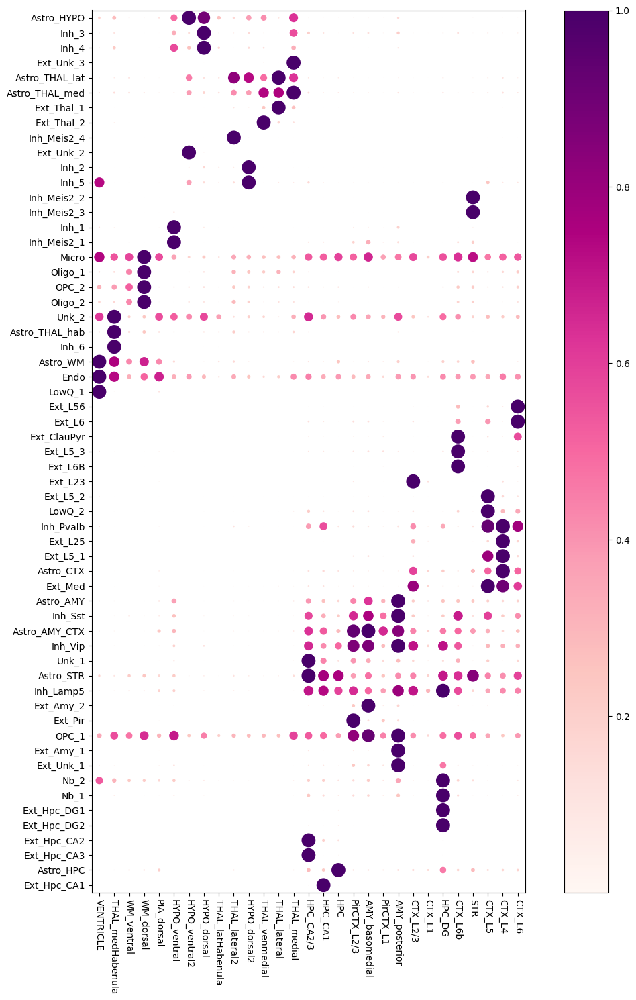

In [11]:
# Compute average abundance of each region cluster
from cell2location.cluster_averages.cluster_averages import get_cluster_averages_df
from cell2location.plt.plot_heatmap import clustermap

ct_aver = get_cluster_averages_df(X=adata_vis.obs[['mean_spot_factors' + i 
                                                      for i in 
                                                   adata_vis.uns['mod']['fact_names']]],
                        cluster_col=adata_vis.obs["region_label"])
ct_aver.index = adata_vis.uns['mod']['fact_names']
#ct_aver.columns = ['region_' + c for c in ct_aver.columns]

# normalise to get 10% of each cell type in each location
ct_aver = (ct_aver.T / ct_aver.max(1)).T
with matplotlib.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cluster_rows=True, cluster_cols=True, figure_size=(12, 15))
    plt.savefig(f'{str(sc.settings.figdir)}/Fig3D_suppl_final_clusters_dotplot.pdf',
                    bbox_inches='tight', facecolor='white')

#### Export the data to plot this heatmap in R

In [12]:
ct_aver = ct_aver.T
ct_aver['region_label'] = ct_aver.index

region_annot = pd.read_csv(f'{sp_results_folder}{run_name}/20200904_regionAnnotation_copy.csv')

region_annot2 = region_annot[['location', 'region_label']]
region_annot2.index = region_annot2['region_label']
region_annot2.index.name = None
region_annot2 = region_annot2.drop_duplicates()

ct_aver['location'] = region_annot2['location'][ct_aver.index]
ct_aver['region_label'] = region_annot2['region_label'][ct_aver.index]

ct_aver['region_label_colors'] = pd.Series(
    adata_vis.uns['region_label_colors'], 
    index=adata_vis.obs['region_label'].astype('category').cat.categories)[ct_aver.index]

ct_aver.to_csv(f'{sp_results_folder}{run_name}/20200904_region_cell_abundances.csv')
ct_aver

,Astro_AMY,Astro_AMY_CTX,Astro_CTX,Astro_HPC,Astro_HYPO,Astro_STR,Astro_THAL_hab,Astro_THAL_lat,Astro_THAL_med,Astro_WM,...,Nb_2,OPC_1,OPC_2,Oligo_1,Oligo_2,Unk_1,Unk_2,region_label,location,region_label_colors
AMY_basomedial,0.628609,1.000000,0.076330,0.120900,0.048665,0.481061,0.051360,0.031586,0.077452,0.105058,...,0.215870,0.928672,0.093385,0.059041,0.020855,0.338913,0.359464,AMY_basomedial,amygdala,#ffff00
AMY_posterior,1.000000,0.843033,0.060797,0.131957,0.157516,0.420687,0.097285,0.047540,0.108416,0.200722,...,0.356791,1.000000,0.065762,0.025773,0.012298,0.278264,0.568233,AMY_posterior,amygdala,#1ce6ff
CTX_L1,0.121267,0.191551,0.187169,0.146897,0.010732,0.188575,0.016387,0.017931,0.027252,0.045923,...,0.031864,0.164403,0.017904,0.010898,0.004466,0.052516,0.124780,CTX_L1,cortex,#ff34ff
CTX_L2/3,0.218312,0.441211,0.591266,0.155904,0.017906,0.439974,0.028266,0.043581,0.072279,0.027920,...,0.077873,0.416052,0.038767,0.028458,0.008602,0.168532,0.247460,CTX_L2/3,cortex,#ff4a46
CTX_L4,0.171190,0.173691,1.000000,0.173750,0.028253,0.412907,0.036320,0.114873,0.132780,0.022586,...,0.025754,0.237181,0.116572,0.161770,0.033165,0.028451,0.216583,CTX_L4,cortex,#008941
CTX_L5,0.202031,0.323937,0.514487,0.147926,0.026186,0.439649,0.032953,0.083519,0.100527,0.032893,...,0.067426,0.354368,0.099813,0.115470,0.035214,0.207684,0.276311,CTX_L5,cortex,#006fa6
CTX_L6,0.191104,0.269796,0.509337,0.181534,0.024874,0.587154,0.042574,0.063004,0.097423,0.080422,...,0.095023,0.387919,0.200642,0.215270,0.113415,0.174103,0.284030,CTX_L6,cortex,#a30059
CTX_L6b,0.254186,0.500352,0.101939,0.175885,0.031356,0.638398,0.058763,0.034416,0.076113,0.182565,...,0.182334,0.563338,0.224075,0.150798,0.181860,0.321322,0.414024,CTX_L6b,cortex,#ffdbe5
HPC,0.174394,0.289030,0.118276,1.000000,0.030346,0.754343,0.050714,0.083144,0.088584,0.247172,...,0.117186,0.379043,0.110856,0.049656,0.054102,0.124755,0.276859,HPC,hippocampus,#7a4900
HPC_CA1,0.267152,0.531982,0.157348,0.230534,0.023894,0.771401,0.036061,0.046624,0.080639,0.079313,...,0.205280,0.498414,0.078402,0.042194,0.017918,0.436094,0.395775,HPC_CA1,hippocampus,#0000a6


In [13]:
region_label_01 = pd.get_dummies(adata_vis.obs['region_label'])
adata_vis.obs[region_label_01.columns] = region_label_01

In [14]:
with matplotlib.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [10, 10]}):
    
    for s in adata_vis.obs['sample'].unique():
        slide = select_slide(adata_vis, s)
        sc.pl.spatial(slide, #cmap='magma',
                      color=region_label_01.columns, ncols=4, 
                      size=1, img_key='hires', alpha_img=1, alpha=0.3,
                      frameon=True, legend_fontsize=20, show=False,
                      vmin=0, vmax='p99.5', save=f'Fig3C_suppl_2D_final_clusters_individual_plots_{s}.pdf',
                      #palette=sc.pl.palettes.default_102
                     )

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


Trying to set attribute `.uns` of view, copying.


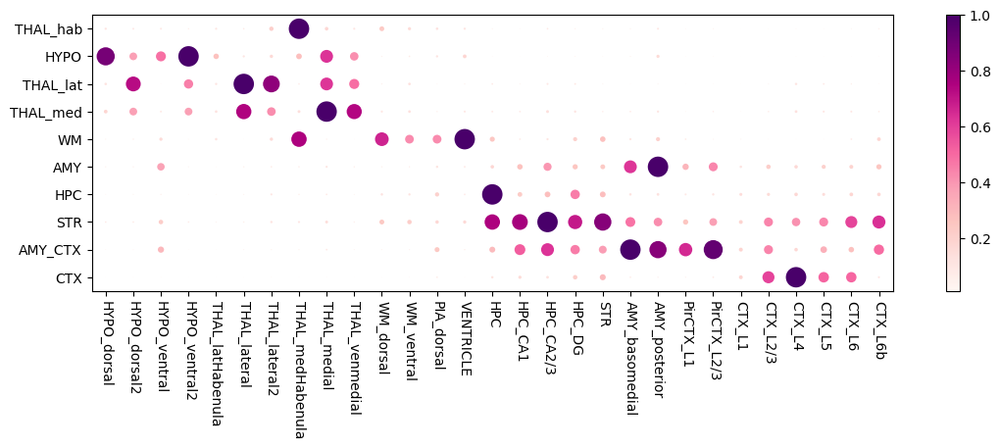

In [32]:
# load order of clusters and regions from R
ct_aver = pd.read_csv(f'{str(sc.settings.figdir)}/Fig3D_astro_location_pheatmap.csv',
                      index_col=0)
ct_aver = ct_aver[ct_aver.columns[::-1]]

with matplotlib.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cluster_rows=False, cluster_cols=False, figure_size=(12, 4.3), equal=True)
    plt.savefig(f'{str(sc.settings.figdir)}/Fig3D_final_clusters_astro_dotplot.pdf',
                    bbox_inches='tight', facecolor='white')

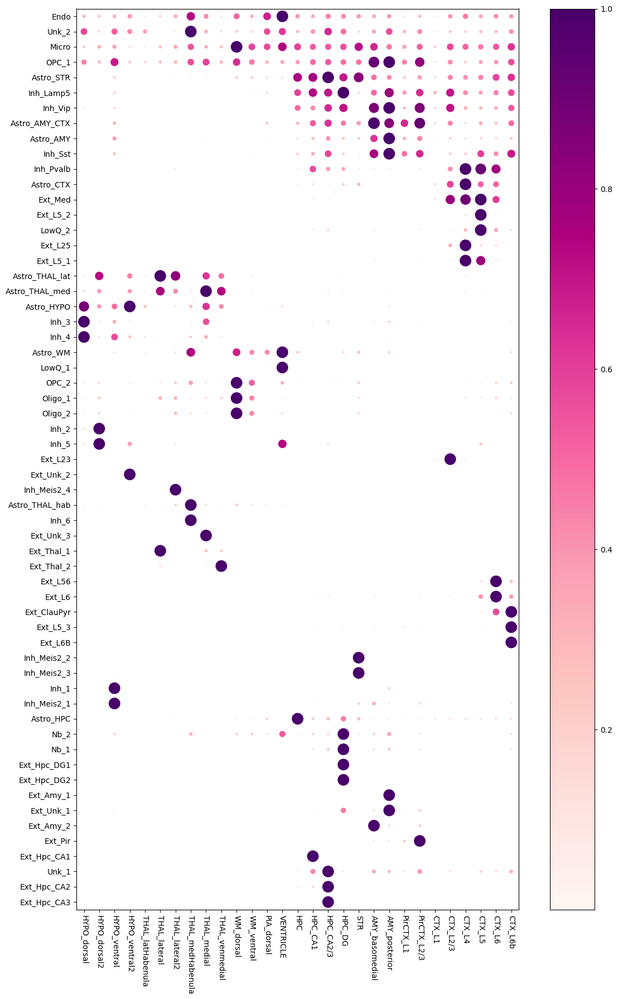

In [33]:
# load order of clusters and regions from R
ct_aver = pd.read_csv(f'{str(sc.settings.figdir)}/Fig3D_Supl_location_pheatmap.csv',
                      index_col=0)
ct_aver = ct_aver[ct_aver.columns[::-1]]

with matplotlib.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cluster_rows=False, cluster_cols=False, figure_size=(12, 18), equal=True)
    plt.savefig(f'{str(sc.settings.figdir)}/Fig3E_suppl_final_clusters_dotplot.pdf',
                    bbox_inches='tight', facecolor='white')

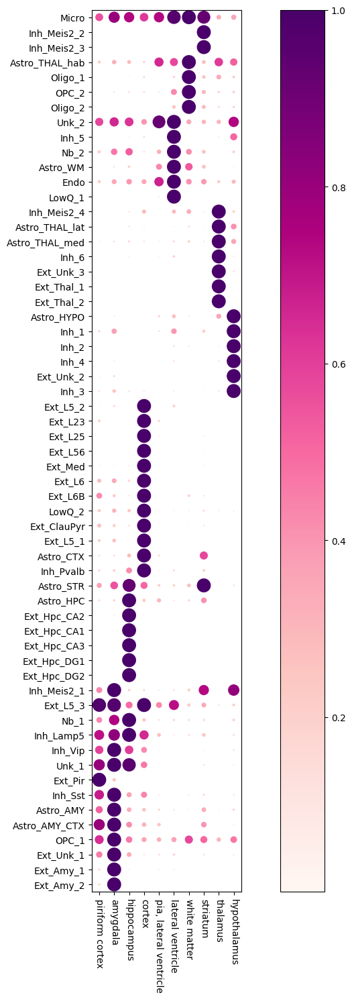

In [16]:
# Compute average abundance of each region cluster
from cell2location.cluster_averages.cluster_averages import get_cluster_averages_df
from cell2location.plt.plot_heatmap import clustermap
#plt.rcParams['xtick.bottom'] = plt.rcParams['xtick.labelbottom'] = True
#plt.rcParams['xtick.top'] = plt.rcParams['xtick.labeltop'] = False

ct_aver = get_cluster_averages_df(X=adata_vis.obs[['mean_spot_factors' + i 
                                                      for i in adata_vis.uns['mod']['fact_names']]],
                        cluster_col=adata_vis.obs["location"])
ct_aver.index = adata_vis.uns['mod']['fact_names']
ct_aver.columns = ct_aver.columns

# normalise to get 10% of each cell type in each location
ct_aver = (ct_aver.T / ct_aver.max(1)).T
with matplotlib.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cluster_rows=True, cluster_cols=True, figure_size=(12, 15))
    plt.savefig(f'{str(sc.settings.figdir)}/Fig3D_suppl_location_dotplot.pdf',
                    bbox_inches='tight', facecolor='white')

### Fig 3E <a class="anchor" id="Fig3E"></a> 

In [17]:
# making copy to transform to assign nice names
clust_names_orig = ['q05_spot_factors' + i for i in adata_vis.uns['mod']['fact_names']]
clust_names = adata_vis.uns['mod']['fact_names']
adata_vis.obs[clust_names] = (adata_vis.obs[clust_names_orig])

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


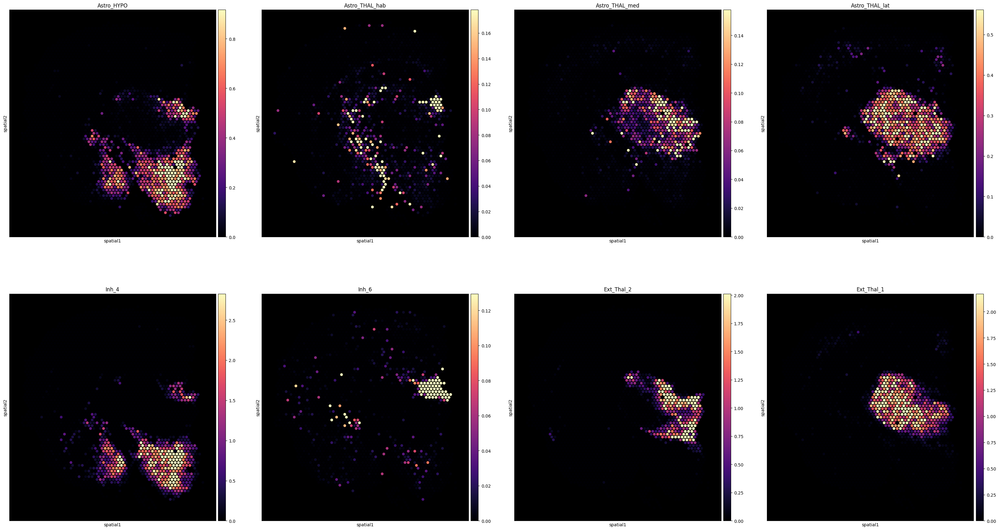

[199.92791119999998, 1701.9231528, 126.19973920000007, 1706.8940144]

In [18]:
ct_list=[
    'Astro_HYPO','Astro_THAL_hab', 'Astro_THAL_med', 'Astro_THAL_lat', 
    'Inh_4', 'Inh_6', 'Ext_Thal_2','Ext_Thal_1'
]

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

# fix cropping coordinates (scanpy inverts them compared to cell2location)
y_size = list(slide.uns['spatial'].values())[0]['images']['hires'].shape[1]

with matplotlib.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [9, 10]}):
    sc.pl.spatial(slide, cmap='magma',
                  color=ct_list, ncols=4, 
                  #library_id=s,
                  size=1.3, img_key='hires', alpha_img=0, alpha=1,
                  frameon=True, legend_fontsize=50,
                  #crop_coord=crop_x + [y_size-crop_y[1]] + [y_size-crop_y[0]],
                  vmin=0, vmax='p98', save=f'Fig3E_dot.pdf'
                 )
crop_x + [y_size-crop_y[1]] + [y_size-crop_y[0]]

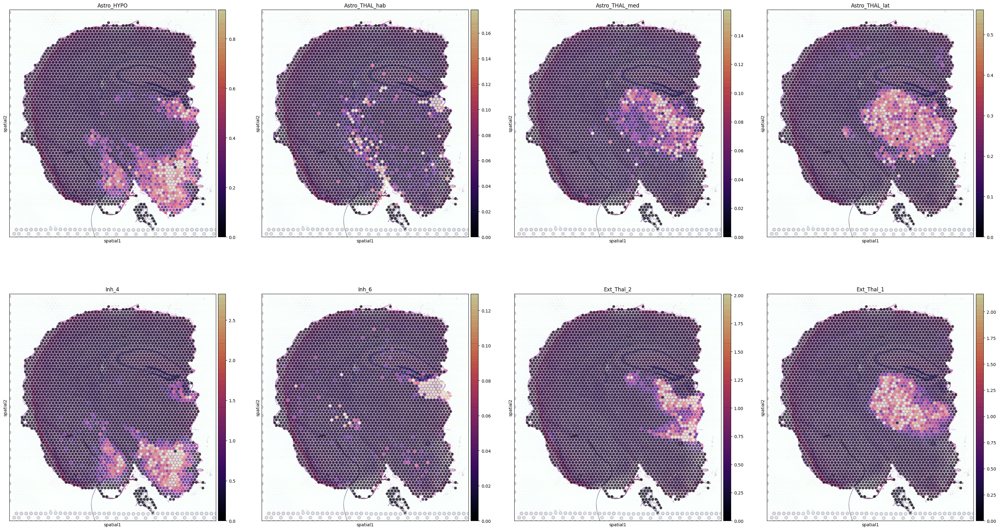

In [19]:
with matplotlib.rc_context({'axes.facecolor':  'black',
                            'figure.figsize': [9, 10]}):
    sc.pl.spatial(slide, cmap='magma',
                  color=ct_list, ncols=4, 
                  #library_id=s,
                  size=1.3, img_key='hires', alpha_img=1, alpha=0.7,
                  frameon=True, legend_fontsize=50,
                  #crop_coord=crop_x + [y_size-crop_y[1]] + [y_size-crop_y[0]],
                  vmin=0, vmax='p98', save=f'Fig3E_dot_with_histology.pdf'
                 )

In [20]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust=[
    'Astro_HYPO','Astro_THAL_hab', 'Astro_THAL_med', 'Astro_THAL_lat', 
    'Inh_4', 'Inh_6', 'Ext_Thal_2','Ext_Thal_1'
]

sel_clust_lab = ['HYPO', 'THAL_hab', 'THAL_med', 'THAL_lat', 
                 'Inh_4', 'Inh_6', 'Ext_Thal_2', 'Ext_Thal_1']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):
    
    for i in range(len(sel_clust_col)):
        
        for s in adata_vis.obs['sample'].unique():
            slide = select_slide(adata_vis, s)
            crop_x, crop_y = get_crop_coord(slide)
            
            if s == 'ST8059050':
                crop_x = [crop_x[0] + 50] + [crop_x[1] - 50]
            
            fig = plot_spatial(slide.obs[[sel_clust_col[i]]], 
                          coords=slide.obsm['spatial'] \
                                  * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                          show_img=True, img_alpha=1,
                          max_color_quantile=0.99, reorder_cmap=[4],
                      img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                          circle_diameter=10, alpha_scaling=1, labels=[sel_clust_lab[i]], 
                         style='fast', # fast dark_background
                         crop_x=crop_x, crop_y=crop_y,
                         colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                         colorbar_shape={'vertical_gaps': 0, 'horizontal_gaps': 1, 
                                         'width': 3.5, 'height': 0.045},
                         colorbar_tick_size=20,
                        );
            fig.savefig(f'{fig_path}Fig3E_single_maps_{sel_clust_col[i]}_{s}.pdf',
                        bbox_inches='tight', facecolor='white');
            fig.clear();

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorica

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorica

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

<Figure size 1500x1800 with 0 Axes>

## Fig 2

### Fig2D <a class="anchor" id="Fig2D"></a> 

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


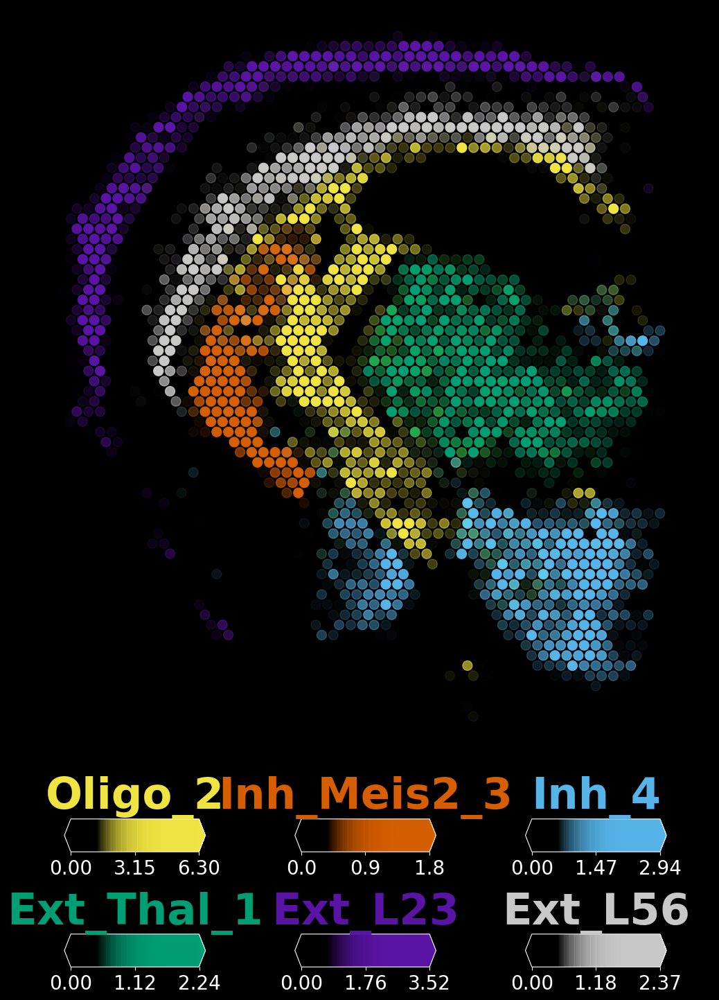

In [21]:
from cell2location.plt.mapping_video import plot_spatial# select up to 6 clusters 
sel_clust = ['Oligo_2', 'Inh_Meis2_3', 'Inh_4', 'Ext_Thal_1', 'Ext_L23', 'Ext_L56']
sel_clust_col = ['mean_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):

    fig = plot_spatial(slide.obs[sel_clust_col], 
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=False, img_alpha=1,
                  max_color_quantile=0.98, #reorder_cmap=[0,4],
              img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=10, alpha_scaling=1, labels=sel_clust, 
                 style='dark_background', # fast dark_background
              crop_x=crop_x, crop_y=crop_y,
                 colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                 colorbar_shape={'vertical_gaps': 0.31, 'horizontal_gaps': 1, 
                                 'width': 3.5, 'height': 0.045},
                 colorbar_tick_size=20,
                )
    fig.savefig(f'{fig_path}Fig2D_multicell_maps.pdf',
                bbox_inches='tight', facecolor='black')

### Fig 2E <a class="anchor" id="Fig2E"></a> 

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


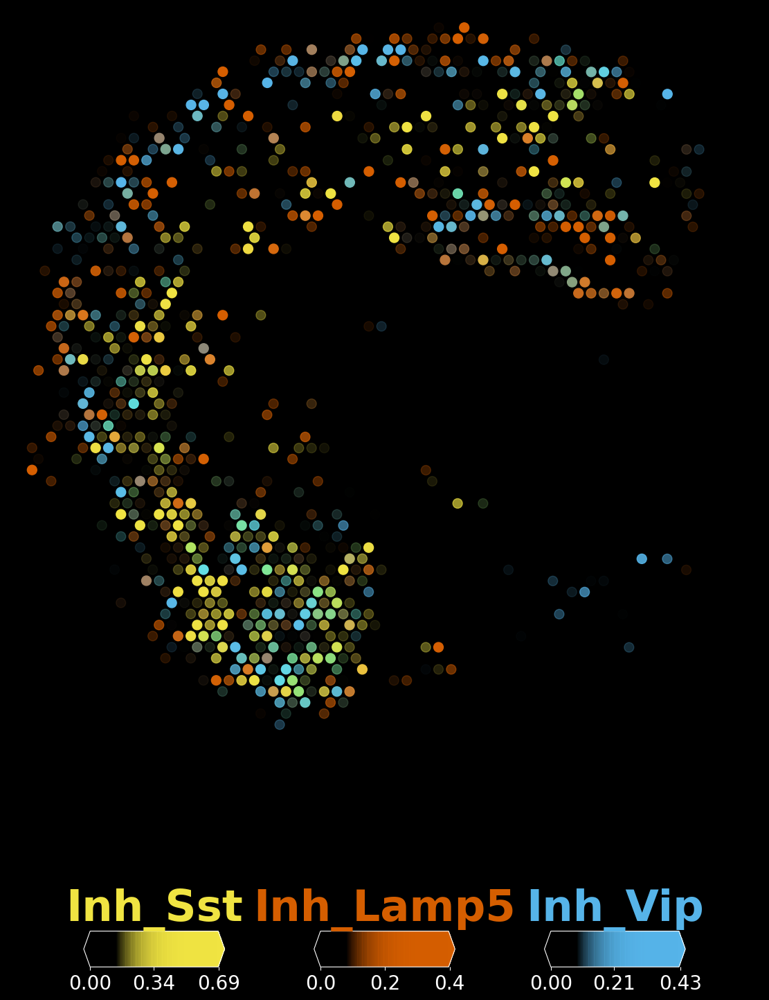

In [22]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = ['Inh_Sst', 'Inh_Lamp5', 'Inh_Vip']
sel_clust_col = ['mean_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):

    fig = plot_spatial(slide.obs[sel_clust_col], 
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=False, img_alpha=1,
                  max_color_quantile=0.98, #reorder_cmap=[0,4],
              img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=10, alpha_scaling=1, labels=sel_clust, 
                 style='dark_background', # fast dark_background
              crop_x=crop_x, crop_y=crop_y,
                 colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                 colorbar_shape={'vertical_gaps': 0.31, 'horizontal_gaps': 1, 
                                 'width': 3.5, 'height': 0.045},
                 colorbar_tick_size=20,
                )
    fig.savefig(f'{fig_path}Fig2E_multicell_maps.pdf',
                bbox_inches='tight', facecolor='black')

### Fig 2F multicolor and panels <a class="anchor" id="Fig2F"></a> 

In [23]:
from cell2location.plt.RotateCrop import RotateCrop
from cell2location.plt.RotateCrop import find_rectangle_corners

#scaling factor between images# picture width
width = 160 
# picture left side segment
bottom_left = np.array([[390, 570], [700, 840]])

points = find_rectangle_corners(bottom_left, width)
print(points)

[[390.         570.        ]
 [495.08491917 449.34694466]
 [805.08491917 719.34694466]]


/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


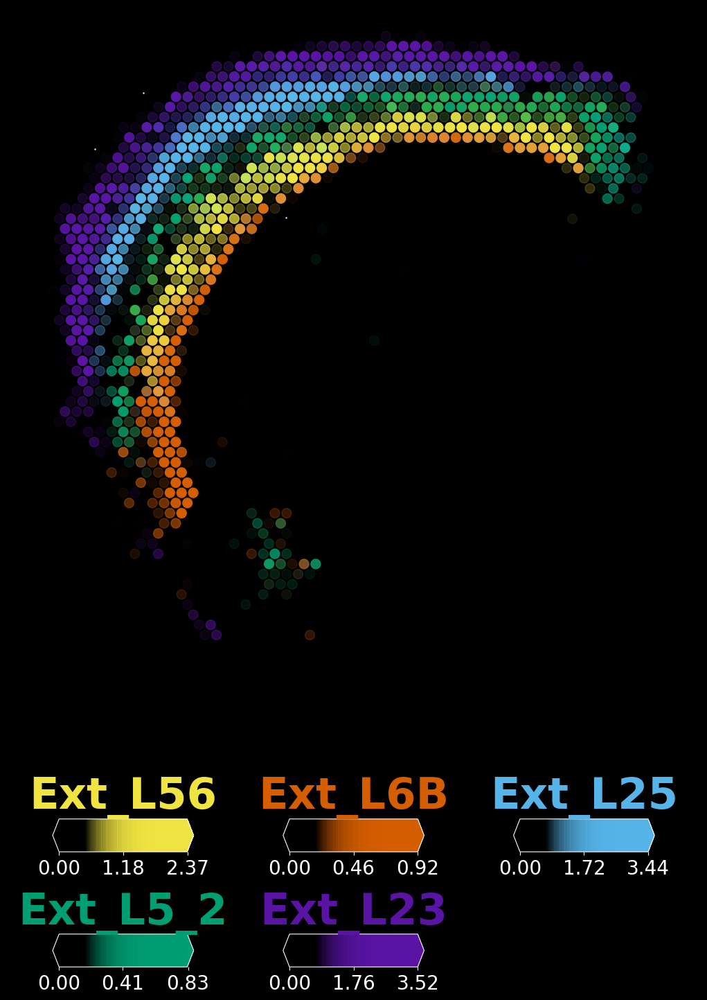

In [24]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = ['Ext_L56', 'Ext_L6B', 'Ext_L25', 'Ext_L5_2', 'Ext_L23']
sel_clust_col = ['mean_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059048')
crop_x, crop_y = get_crop_coord(slide)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (15,18)}):

    fig = plot_spatial(slide.obs[sel_clust_col], 
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=False, img_alpha=1,
                  max_color_quantile=0.98, #reorder_cmap=[0,4],
              img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=10, alpha_scaling=1, labels=sel_clust, 
                 style='dark_background', # fast dark_background
              crop_x=crop_x, crop_y=crop_y,
                 colorbar_label_kw={'size': 45, 'weight': 'bold', 'y': 1.29},
                 colorbar_shape={'vertical_gaps': 0.31, 'horizontal_gaps': 1, 
                                 'width': 3.5, 'height': 0.045},
                 colorbar_tick_size=20,
                )
    # plot small white dots showing the positions of cropped out section
    fig.axes[0].scatter(x=points[:, 0], y=points[:, 1], s=0.5, c='w')
    fig.savefig(f'{fig_path}Fig2F_multicell_maps.pdf',
                bbox_inches='tight', facecolor='black')

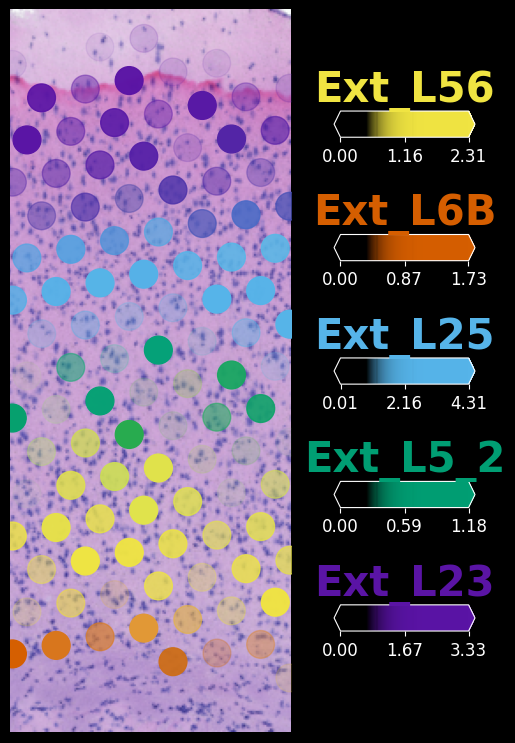

In [25]:
dots = slide.obsm['spatial'] \
                      * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef']

rc = RotateCrop(list(slide.uns['spatial'].values())[0]['images']['hires'],
                points, rotate90=1, flip_axes=False)
cropped = rc.crop_rotate()
dots_, mask = rc.rotate_points(dots, return_mask=True)

matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
with matplotlib.rc_context({"figure.figsize": (6,12)}):
    fig = plot_spatial(slide.obs.loc[mask,sel_clust_col], 
                      coords=dots_, 
                      show_img=True, img_alpha=1,
                      max_color_quantile=0.98, #reorder_cmap=[0,4],
                  img=cropped,
                      circle_diameter=20, alpha_scaling=1, labels=sel_clust, 
                     style='dark_background', # fast dark_background
              crop_y=[0, cropped.shape[0]], crop_x=[0, cropped.shape[1]],
                     colorbar_position='right',
                     colorbar_label_kw={'size': 30, 'weight': 'bold', 'y': 1.29},
                     colorbar_shape={'vertical_gaps': 2, 'horizontal_gaps': 0.2, 
                                     'width': 0.5, 'height': 0.25},
                     colorbar_tick_size=12,
                    )

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


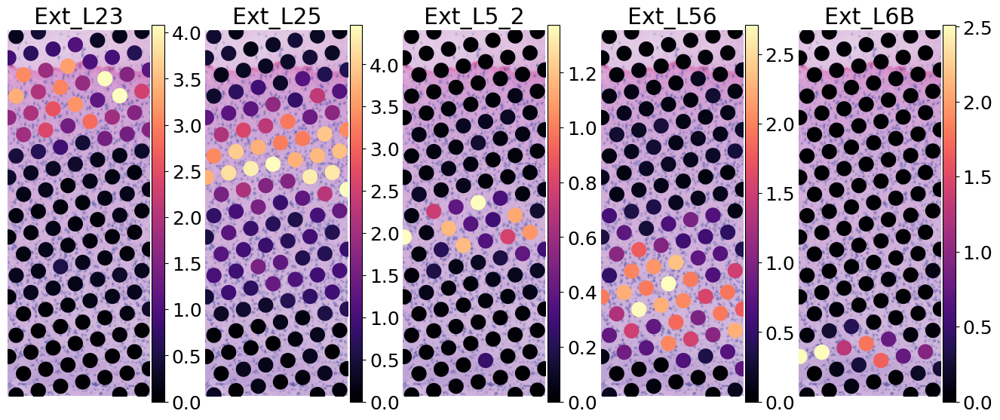

<Figure size 250x700 with 0 Axes>

In [26]:
cropped_adata = slide.copy()
cropped_adata = cropped_adata[mask,:]
cropped_adata.uns['spatial'][list(cropped_adata.uns['spatial'].keys())[0]]['images']['hires'] = cropped
cropped_adata.uns['spatial'][list(cropped_adata.uns['spatial'].keys())[0]]['scalefactors']['tissue_hires_scalef'] = 1
cropped_adata.obsm['spatial'] = dots_

sel_clust = ['Ext_L23', 'Ext_L25', 'Ext_L5_2', 'Ext_L56', 'Ext_L6B']
sel_clust_col = ['mean_spot_factors' + str(i) for i in sel_clust]
cropped_adata.obs[sel_clust] = cropped_adata.obs[sel_clust_col]

sc_figpath = sc.settings.figdir
sc.settings.figdir = f'{fig_path}'

with matplotlib.rc_context({'axes.facecolor':  'black', 'figure.figsize': [2.5,7], 'font.size': 18}):
    sc.pl.spatial(cropped_adata, img_key = "hires", cmap='magma',
                  color=sel_clust, size=0.12,
                  alpha_img=0.85, vmin=0, vmax='p99.2',#vmax=5,#vmax=5000, #vmax=4,
                  ncols=5,
                  gene_symbols='SYMBOL', frameon=False, wspace=0.26, save=f'Fig2F_suppl_panels.pdf',
                  crop_coord=[0, cropped.shape[1], cropped.shape[0], 0])
    plt.tight_layout();
sc.settings.figdir = sc_figpath

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


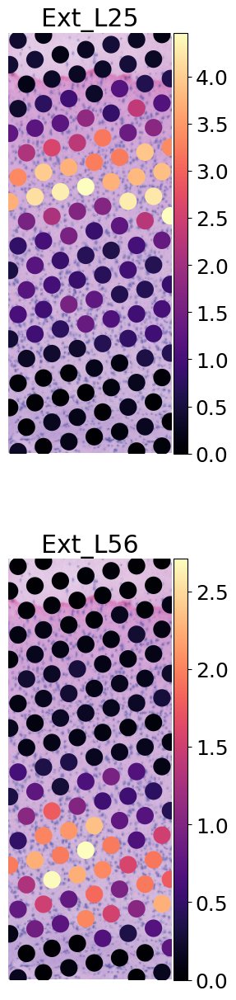

<Figure size 250x700 with 0 Axes>

In [27]:
cropped_adata = slide.copy()
cropped_adata = cropped_adata[mask,:]
cropped_adata.uns['spatial'][list(cropped_adata.uns['spatial'].keys())[0]]['images']['hires'] = cropped
cropped_adata.uns['spatial'][list(cropped_adata.uns['spatial'].keys())[0]]['scalefactors']['tissue_hires_scalef'] = 1
cropped_adata.obsm['spatial'] = dots_

sel_clust = ['Ext_L25', 'Ext_L56']
sel_clust_col = ['mean_spot_factors' + str(i) for i in sel_clust]
cropped_adata.obs[sel_clust] = cropped_adata.obs[sel_clust_col]

sc_figpath = sc.settings.figdir
sc.settings.figdir = f'{fig_path}'

with matplotlib.rc_context({'axes.facecolor':  'black', 'figure.figsize': [2.5,7], 'font.size': 18}):
    
    sc.pl.spatial(cropped_adata, img_key = "hires", cmap='magma',
                  color=sel_clust, size=0.12,
                  alpha_img=0.85, vmin=0, vmax='p99.2',#vmax=5,#vmax=5000, #vmax=4,
                  ncols=1,
                  gene_symbols='SYMBOL', frameon=False, wspace=0.26, save=f'Fig2F_panels_selected.pdf',
                  crop_coord=[0, cropped.shape[1], cropped.shape[0], 0])
    plt.tight_layout();
sc.settings.figdir = sc_figpath

### Fig 2G reproducibility of cortical layer mapping between mice <a class="anchor" id="Fig2G"></a> 

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'SSp_manual_layers' as categorical


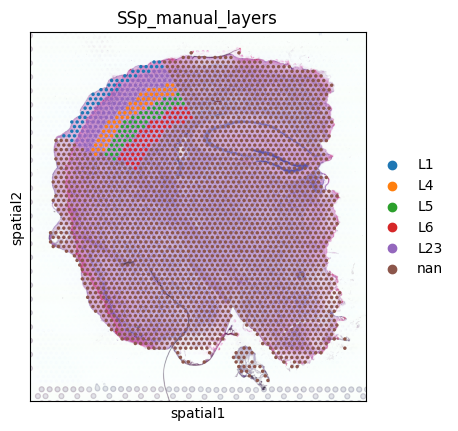

In [28]:
### load cortical layer annotations ###
# read in manual SSp cortical layer annotations
lay = pd.DataFrame()
for s in np.unique(adata_vis.obs['sample']):
    
    lay_file = results_folder + 'manual_SSp_layers/SSp_ManLayerAnn_' \
                + str(s) + '.csv'
    lay_ = pd.read_csv(lay_file, index_col='Barcode')
    lay_.index = [str(s) + '_' + i for i in lay_.index]
    lay = pd.concat([lay, lay_])
    
adata_vis.obs['SSp_manual_layers'] = lay.reindex(index=adata_vis.obs_names) 

# plot to check that it loaded correctly
slide = select_slide(adata_vis, 'ST8059048')
sc.pl.spatial(slide, img_key = "hires", cmap='magma',
              color=['SSp_manual_layers'], size=1,
              gene_symbols='SYMBOL', ncols=1)

In [29]:
# Define functions that compute per layer average abundance of each cell type & plot annotated scatterplot
def layer_distribution(slide, lay=None, layer_col='SSp_manual_layers', 
                       post_type='mean_spot_factors', 
                       summary_fun=np.mean, proportion_per_layer=False):
    
    sel_clust_col = [post_type in i for i in slide.obs.columns]
    sel_clust_col = slide.obs.columns[sel_clust_col]
    from re import sub # create nice names
    sel_clust = [sub(post_type, '', i) for i in sel_clust_col]

    # log-transform and save with nice names
    #slides[s].obs[sel_clust] = np.log10(slides[s].obs[sel_clust_col])
    infer_lay_df = slide.obs[sel_clust_col]
    infer_lay_df.columns = sel_clust

    infer_lay = pd.DataFrame(index=sel_clust)
    for r in slide.obs[layer_col].unique():
        ind = slide.obs[layer_col].isin([r])
        # sum / mean of cell density across all spots within a region
        infer_lay[r] = summary_fun(infer_lay_df.loc[ind, :], axis=0)
    
    infer_lay = infer_lay[['L1', 'L23', 'L4', 'L5', 'L6']]
    infer_lay.columns = ['L1', 'L2-3', 'L4', 'L5', 'L6']
    infer_lay = infer_lay.loc[infer_lay.sum(1) > 0, :]
    if lay is not None:
        infer_lay = infer_lay.loc[lay.index, :]
    infer_lay = infer_lay.loc[np.sort(list(infer_lay.index)), :]
    
    # convert to proportions per layer
    if proportion_per_layer is True:
        infer_lay = infer_lay / infer_lay.sum(0)
    
    return infer_lay

def plot_hist2d(x, y, xlab, ylab, log=False, scatter_kwdargs:dict={}):
    
    corr = np.corrcoef(
        x.values.flatten(), 
        y.values.flatten())[0,1]
    corr_log10 = np.corrcoef(
        np.log10(x.values.flatten() + 1), 
        np.log10(y.values.flatten() + 1))[0,1]

    if log:
        x = np.log10(x.values.flatten() + 1)
        y = np.log10(y.values.flatten() + 1)
        
        xlab = xlab + ' (log10)'
        ylab = ylab + ' (log10)'
    else:
        x = x.values.flatten()
        y = y.values.flatten()

    #plt.hist2d(x, y, bins=35, norm=matplotlib.colors.LogNorm());
    plt.scatter(x, y, **scatter_kwdargs);
    plt.xlabel(xlab);
    plt.ylabel(ylab);
    plt.xlim(0);
    plt.ylim(0);
    plt.title(r'$R^2$: ' \
              + str(np.round(corr, 3))\
              #+ r', $R^2$ log: '+ str(np.round(corr_log10, 3))
             );

Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.
/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymcr3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
Trying to set attribute `.uns` of view, copying.


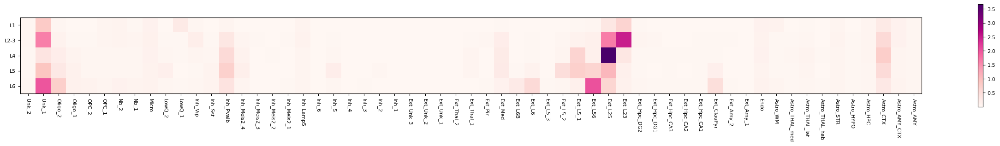

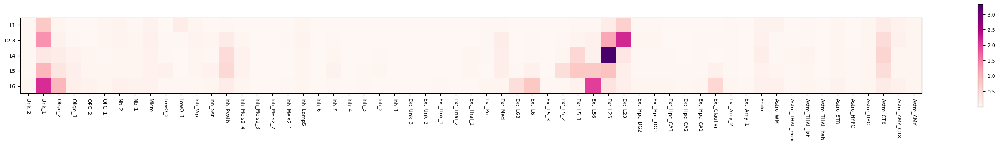

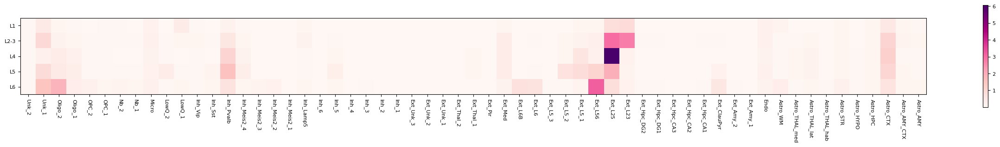

In [30]:
# Compute per layer abundances
infer_lay_ST8059048 = layer_distribution(select_slide(adata_vis, 'ST8059048').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059049 = layer_distribution(select_slide(adata_vis, 'ST8059049').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059051 = layer_distribution(select_slide(adata_vis, 'ST8059051').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)
infer_lay_ST8059052 = layer_distribution(select_slide(adata_vis, 'ST8059052').copy(), 
                                         summary_fun=np.mean, proportion_per_layer=False)

# Plot per layer abundances of all cell types per section for supplementary materials
from cell2location.plt.plot_heatmap import clustermap
with matplotlib.rc_context({'axes.facecolor': 'white', 'font.size': 8}):
    clustermap(infer_lay_ST8059048.T, figure_size=(25, 3), 
               cmap='RdPu', log=False,
               cluster_rows=False, cluster_cols=False)
    plt.show()
    clustermap(infer_lay_ST8059049.T, figure_size=(25, 3), 
               cmap='RdPu', log=False,
               cluster_rows=False, cluster_cols=False)
    plt.show()
    clustermap(infer_lay_ST8059052.T, figure_size=(25, 3), 
               cmap='RdPu', log=False,
               cluster_rows=False, cluster_cols=False)
    plt.show()

### Fig 2G <a class="anchor" id="Fig2Gplot"></a> 

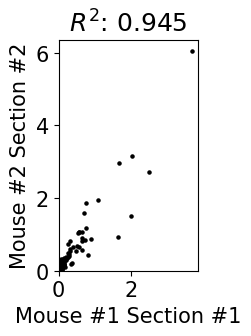

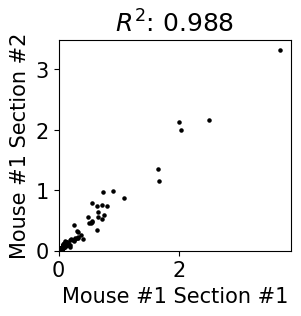

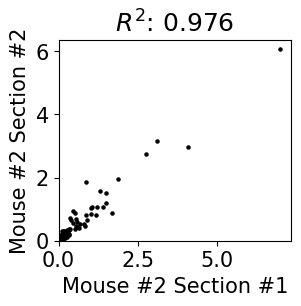

In [31]:
### Plot Inferred cell density in each layer for technical and biological replicates ###
with matplotlib.rc_context({'axes.facecolor': 'white', 'font.size': 15,
                            'figure.figsize': [3, 3]}):
    
    plot_hist2d(infer_lay_ST8059048, infer_lay_ST8059052, 
                'Mouse #1 Section #1', 
                'Mouse #2 Section #2', 
               scatter_kwdargs={'s': 5, 'c': 'black'})
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig(f'{fig_path}/Fig2G_biol_repl.pdf', bbox_inches='tight')
    
    plt.show()
    
    plot_hist2d(infer_lay_ST8059048, infer_lay_ST8059049, 
                'Mouse #1 Section #1', 
                'Mouse #1 Section #2',
               scatter_kwdargs={'s': 5, 'c': 'black'})
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig(f'{fig_path}/Fig2G_tech_repl.pdf', bbox_inches='tight')
    plt.show()
    
    plot_hist2d(infer_lay_ST8059051, infer_lay_ST8059052, 
                'Mouse #2 Section #1', 
                'Mouse #2 Section #2',
               scatter_kwdargs={'s': 5, 'c': 'black'})
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig(f'{fig_path}/Fig2G_tech_repl_mouse2.pdf', bbox_inches='tight')
    plt.show()